# Kmeans Examples
This notebook shows the development of the kmeans algorithms up to SLIC and MSLIC. Many of these methods are now outdated but kept in the legacy directory for demonstraition here.

## Github Setup
If not already present this clones the code repo into google colab.

In [133]:
from getpass import getpass
import os

!git config --global user.name "Richard Boyne"
!git config --global user.email "boynerichard@yahoo.co.uk"

if not os.path.isdir(".git"):
    user = "Boyne272"
    password = getpass('github password')
    os.environ['GITHUB_AUTH'] = user + ':' + password

    # clone the repo
    !git clone --quiet https://$GITHUB_AUTH@github.com/msc-acse/acse-9-independent-research-project-Boyne272.git repo

    # move the repo up one
    !mv repo/.git .
    !git checkout kmeans
    !git reset --hard
    
if os.path.isdir("sample_data"):
    !rm -r sample_data/
    
if os.path.isdir("repo"):    
    !rm -r repo
    
# !git show --summary
!git log

commit d28b1806ab860bd6c4061a987c4cd788b395b410 (HEAD -> kmeans)
Author: Richard Boyne <boynerichard@yahoo.co.uk>
Date:   Tue Aug 13 13:43:33 2019 +0000

    Docstring change

commit 1a290c55f0edb6fabe3f66f23ba278d291a9c7ed
Author: Richard Boyne <boynerichard@yahoo.co.uk>
Date:   Tue Aug 13 13:41:35 2019 +0000

    Minor bug fix
    
    forgot to uncomment import

commit 71de98496e7904baf8d3b724bb742041eb259c43 (origin/kmeans)
Author: Richard Boyne <boynerichard@yahoo.co.uk>
Date:   Tue Aug 13 12:43:01 2019 +0000

    Some small changes to SLIC and additional tests
    
    A default arg was added for scaling the color-position space. Tests were updated to the new structure and an acceptance test was introduced on a a small sample image

commit 9875ba88b421a085ab7ccaaa3533bedef5d3125e (origin/merging)
Author: Richard Boyne <boynerichard@yahoo.co.uk>
Date:   Thu Aug 8 15:06:53 2019 +0000

    cleaned SLIC and MSLIC
    
    numerious small changes including hiding and renaming vairable

## Imports
Some python magic functions for convenience, some basic packages that are often used and adds the path to the local python modules.

In [77]:
# Ipython magic functions
%load_ext autoreload
%autoreload 2
%matplotlib inline

# add paths to look for local modules
import sys
sys.path.insert(0, "/content/kmeans/")
sys.path.insert(0, "/content/kmeans/legacy/")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [0]:
# imports
import matplotlib.pyplot as plt
import numpy as np
# from tools import set_seed, get_img, progress_bar

## First simple 2d kmeans
Works only on 2d data to get the general shape of the algorithm

Progress |##############################################    |

[Text(0.5, 1.0, '10 iterations')]

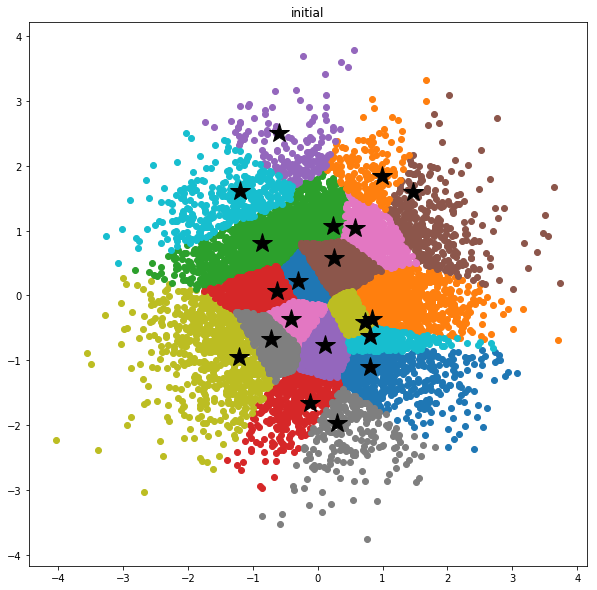

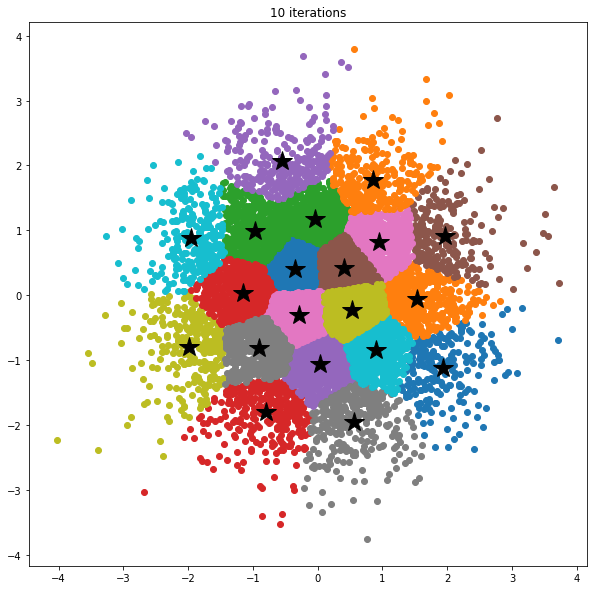

In [81]:
from kmeans_basic import kmeans

# generate random 2d data
N = 10000
x = torch.randn(N, 2, dtype=torch.float64)

# create the kmeans object
obj = kmeans(x, 20)
obj.update_clusters()
obj.plot().set(title='initial')

obj.iterate(10)
obj.plot().set(title="10 iterations")


## Image kmeans with no locality restriction
This is just a kmeans over the position color space where the distance between every vector and kmeans centroid is calculated.

Progress |##############################################    |  111.32541500000002 s


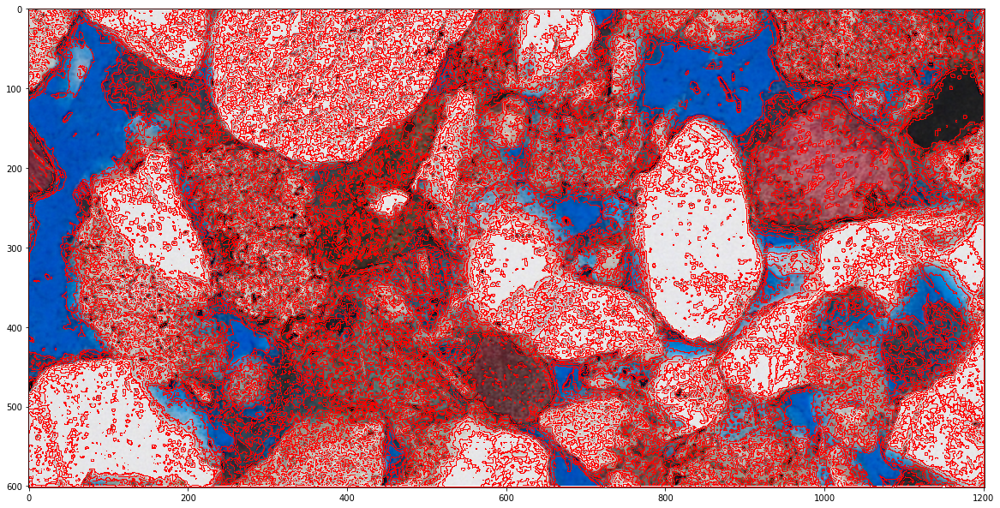

In [82]:
from kmeans_img import kmeans_img
from tools import set_seed, get_img

def scaled_dist_metric(cent, vecs, factor=1/(600*1200)):
    color    = (cent[2:]-vecs[:, 2:]).norm(dim=1)
    position = (cent[:2]-vecs[:, :2]).norm(dim=1)
    return color + factor*position

set_seed(10)

img = get_img("images/TX1_white_cropped.tif")
obj = kmeans_img(img, 20, dist_func=scaled_dist_metric)
obj.iterate(10)

mask = obj.get_mask(edge=True, rgba=True)
fig, ax = plt.subplots(figsize=[20, 20])
ax.imshow(img)
ax.imshow(mask)

## Image Kmeans with locality restriction by binning
Same as above but now the kmeans centroids are restricted to only look in adjasent bins

Progress |###################################################| 55.8457 s

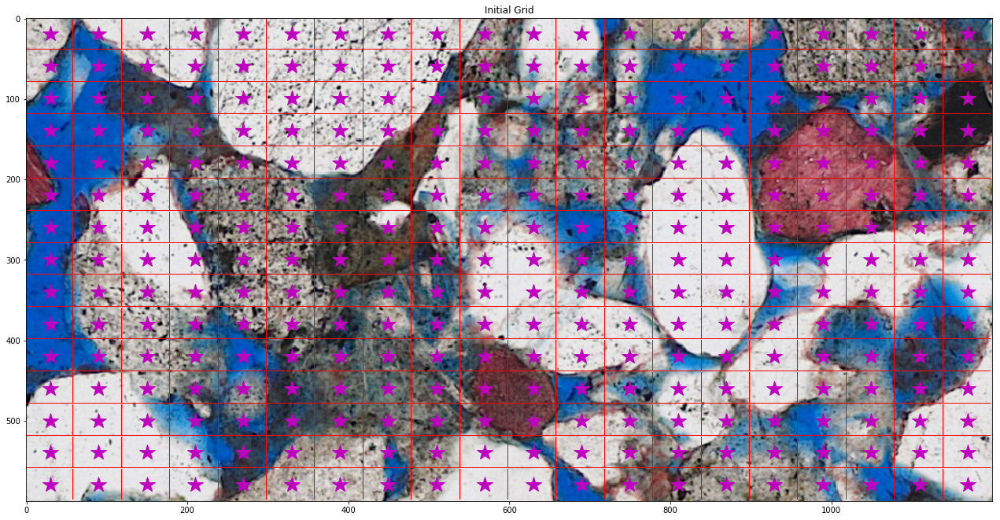

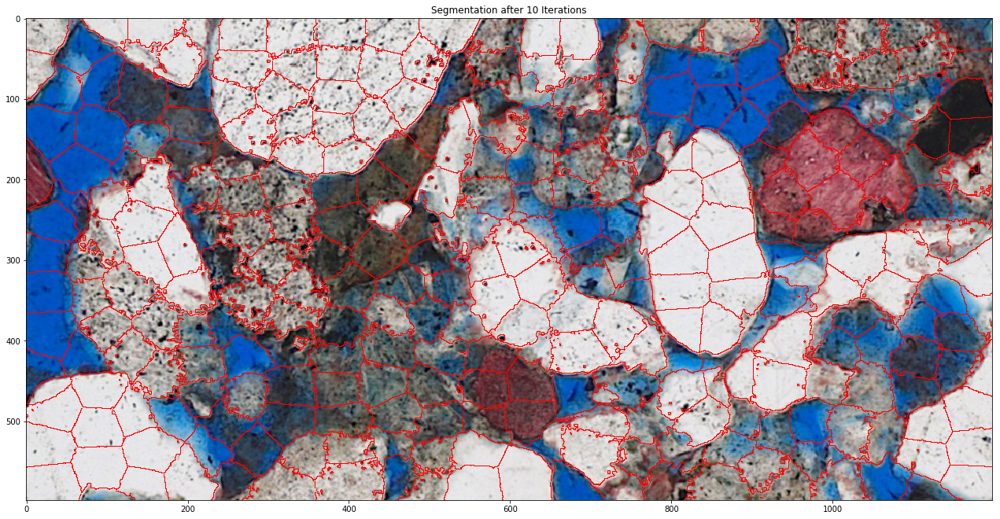

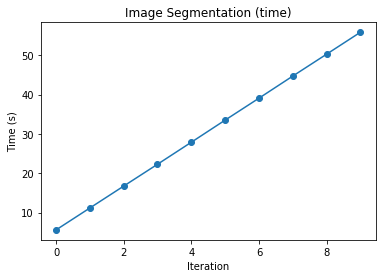

In [83]:
from kmeans_local import kmeans_local

# setup
set_seed(10)
img = get_img("images/TX1_white_cropped.tif")
obj = kmeans_local(img, [20,15])

# plot the initial binning 
fig, ax = plt.subplots(figsize=[22,22])
obj.plot("bins", ax=ax)
obj.plot("centers", ax=ax)
ax.set(title='Initial Grid')

# iterate
obj.iterate(10)

# plot the resulting segmentation
fig, ax = plt.subplots(figsize=[22, 22])
obj.plot('default', ax=ax)
ax.set(title='Segmentation after 10 Iterations')

# plot the time taken
obj.plot('time')

## SLIC implentation
This is a formalisation of Kmeans local above where the color-position space is appropirately scaled

Progress |###################################################| 55.7582 s

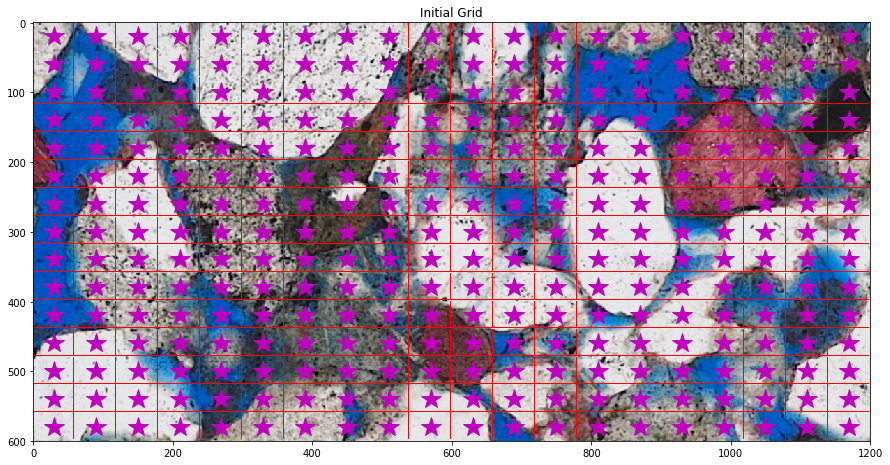

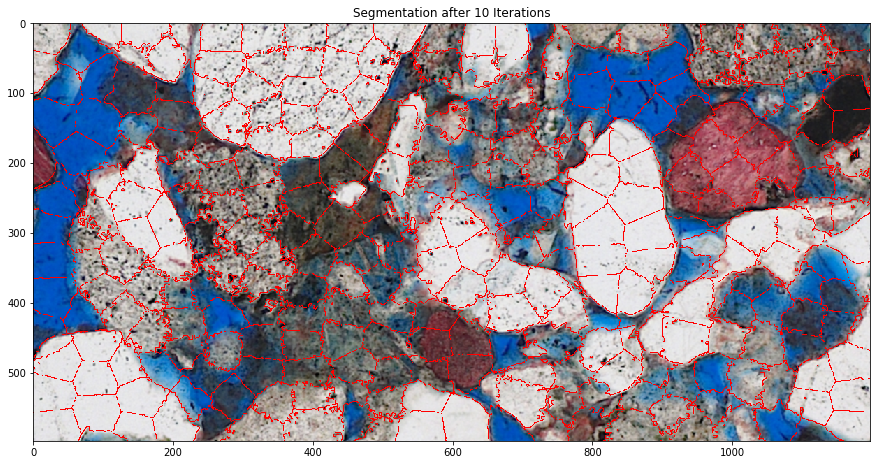

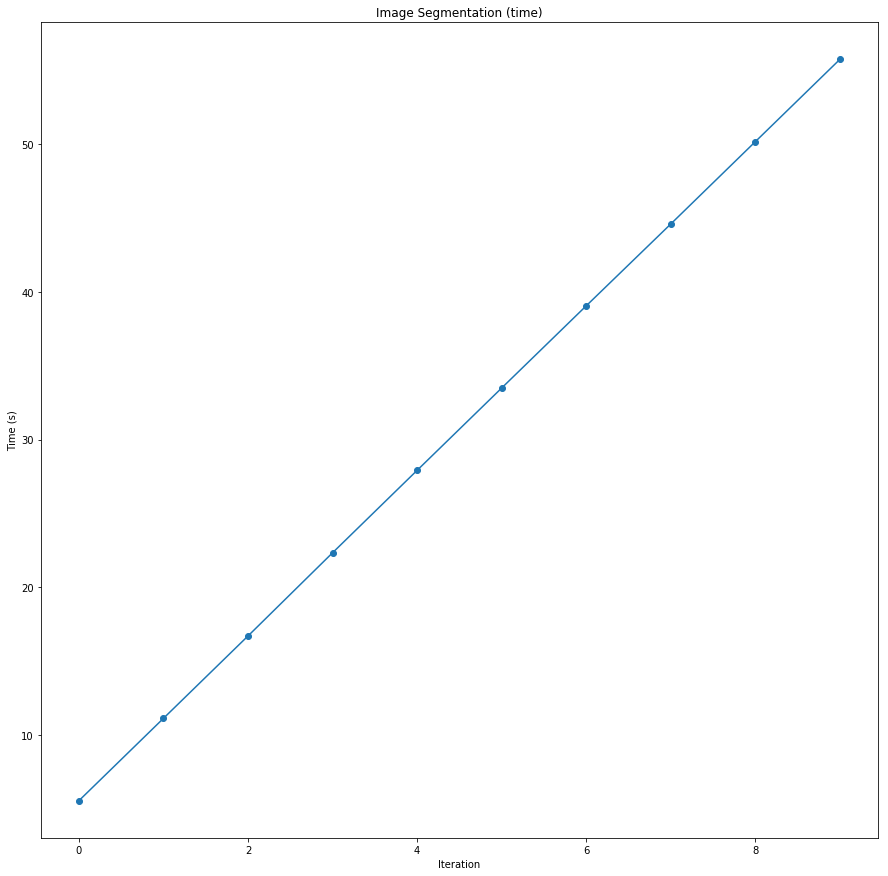

In [161]:
# run an example
from tools import get_img
from SLIC import SLIC

# setup
img = get_img("images/TX1_white_cropped.tif")
obj = SLIC(img, [20,15])

# plot the initial binning 
obj.plot("setup")
plt.gca().set(title='Initial Grid')

# iterate
obj.iterate(10)

# plot the resulting segmentation
obj.plot('default')
plt.gca().set(title='Segmentation after 10 Iterations')

# plot the time taken
obj.plot('time')

## MSLIC implenetation using both polarised and white light
This iterates multiple SLIC instances at the same time and then communicates so that clusters are formed based on the combined distances from all images. Here a comparison between MSLIC with both a white light and polarised image is compared to SLIC on both indevidually (not white light and polar are slightly miss-aligned which affects these results).

In [0]:
# run an example of SLIC on two images, then MSLIC on both
from tools import get_img
from MSLIC import MSLIC_wrapper

# setup
grid = [40, 20]
img_white = get_img("images/TX1_white_cropped.tif")
img_polar = get_img("images/TX1_polarised_cropped.tif")

Progress |###################################################| 70.7163 s

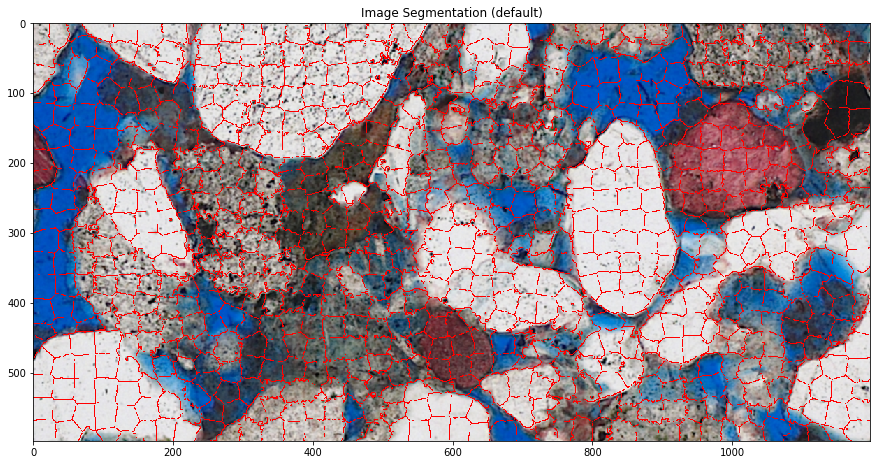

In [158]:
# iterate SLIC with just the white image
obj_white = SLIC(img_white, grid)
obj_white.iterate(10)
obj_white.plot()

Progress |###################################################| 70.4753 s

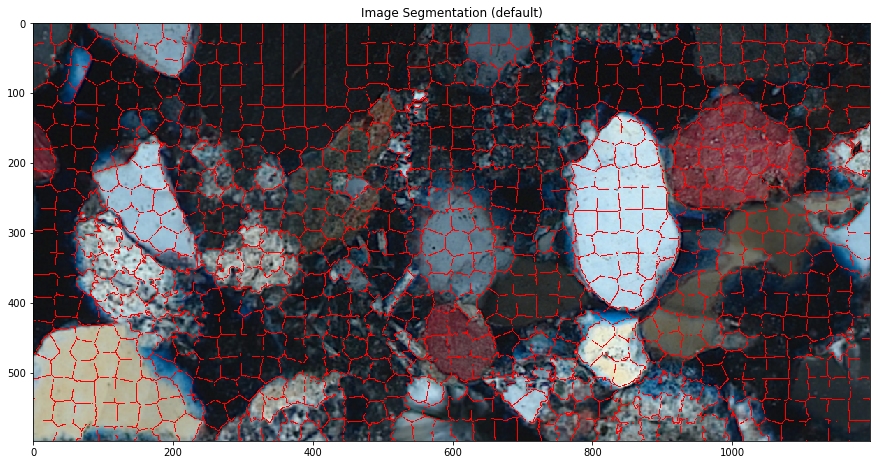

In [159]:
# iterate SLIC with just the polar image
obj_polar = SLIC(img_polar, grid)
obj_polar.iterate(10)
obj_polar.plot()

Progress |###################################################| 122.2974 s

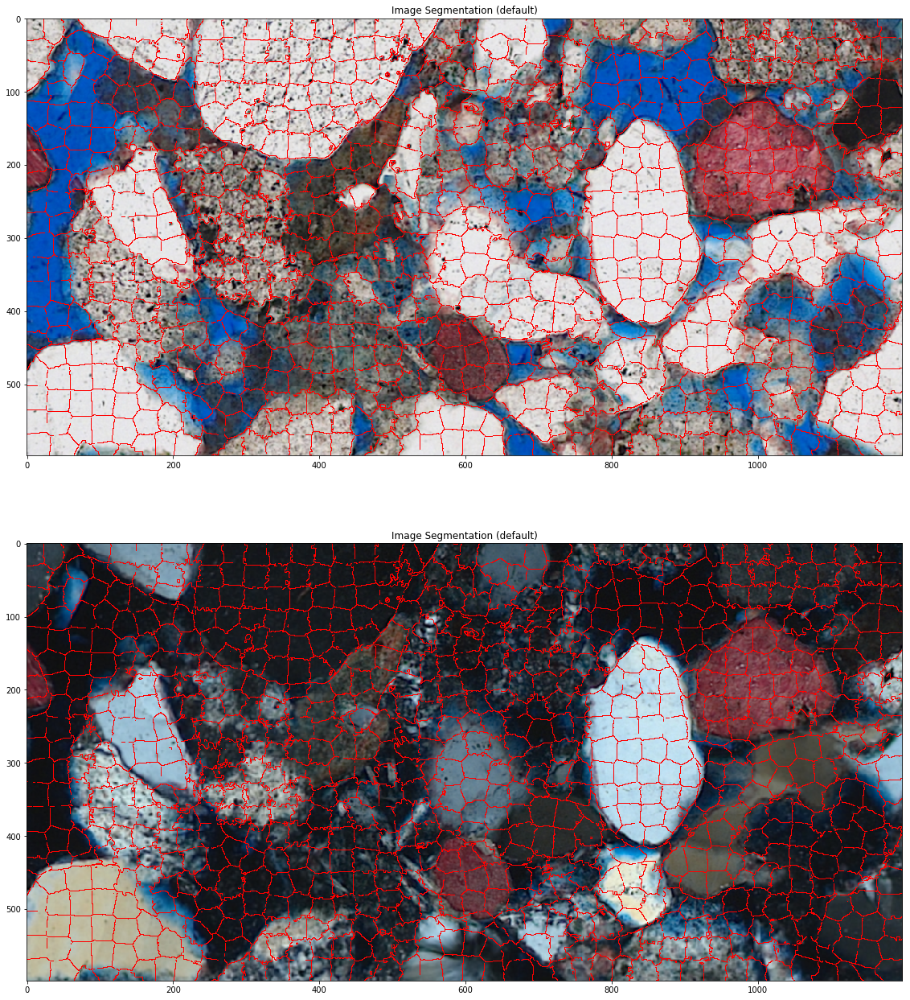

In [160]:
# iterate MSLIC with both white and polar images
obj_both = MSLIC_wrapper([img_white, img_polar], grid)
obj_both.iterate(10)
obj_both.plot()